In [2]:
import xarray as xr
import xscen as xs
import glob
from xscen import CONFIG
from matplotlib import pyplot as plt

xs.load_config("../config/config_general.yml", "../config/config_region.yml", "../config/paths.yml")
source=['ACCESS-CM2', 'CMCC-ESM2', 'CNRM-CM6-1', 'CNRM-ESM2-1',   'INM-CM5-0', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', ]
exp=['ssp245','ssp370']

/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()
/cvmfs/soft.computecanada.ca/easybuild/software/2023/x86-64-v3/MPI/gcc12/openmpi4/esmf/8.8.0/lib/python3.12/site-packages/esmpy/interface/loadESMF.py:94: VersionWarning: ESMF installation version 8.8.0, ESMPy version 8.8.0b0
  warnings.warn("ESMF installation version {}, ESMPy version {}".format(
/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/intake_esm/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [3]:


for f in glob.glob(f'{CONFIG['paths']['final']}/checks/QC-E5L/*'):
    print(f.split("/")[-1])
    ds= xr.open_zarr(f)
    for var in ds.data_vars:
        if ds[var].values:
            print(var, ds[var].values)

CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp245_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_CMCC_CMCC-ESM2_ssp245_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp245_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp370_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp370_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_CMCC_CMCC-ESM2_ssp370_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_CNRM-CERFACS_CNRM-ESM2-1_ssp370_r1i1p1f2_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_MRI_MRI-ESM2-0_ssp370_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_MPI-M_MPI-ESM1-2-LR_ssp245_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_CNRM-CERFACS_CNRM-CM6-1_ssp370_r1i1p1f2_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_MPI-M_MPI-ESM1-2-LR_ssp370_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_ScenarioMIP_MRI_MRI-ESM2-0_ssp245_r1i1p1f1_global+QC-E5L_checks.zarr.zip
CMIP6_S

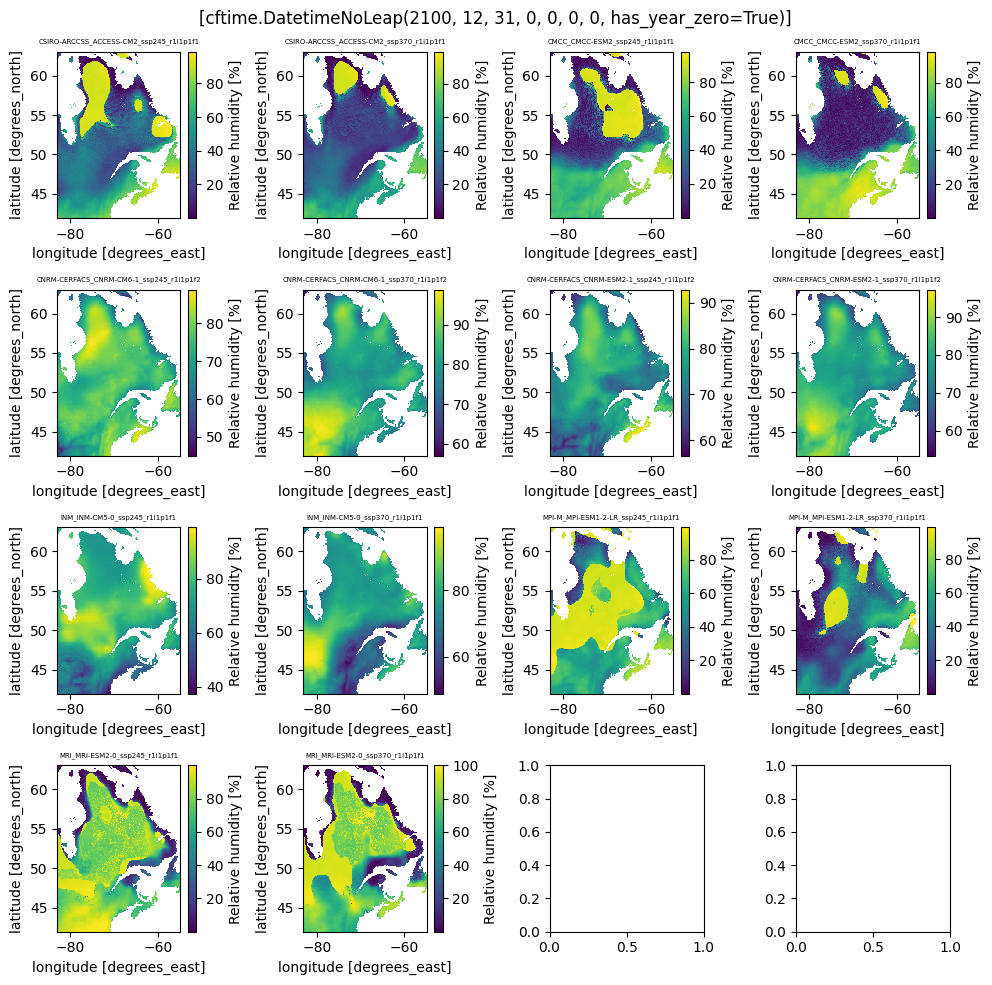

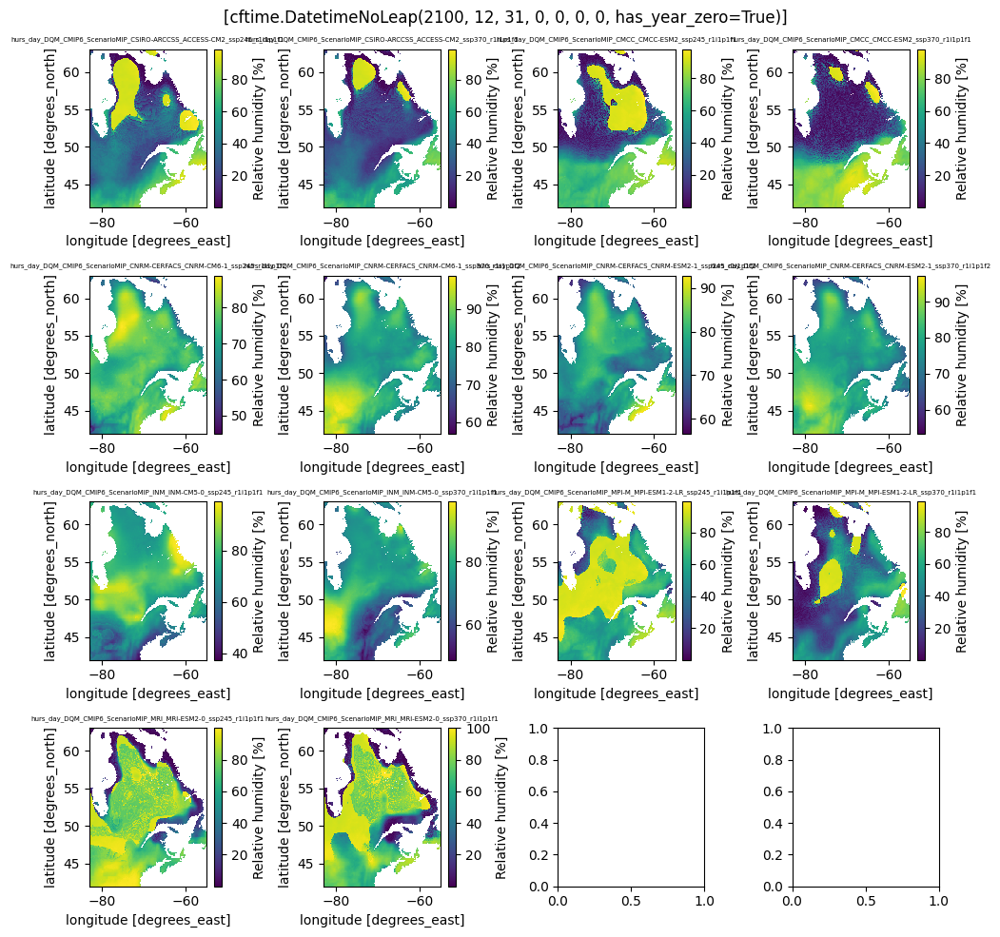

In [67]:
# weird spots in the winter
time='2100-12-31'
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        f=glob.glob(f'{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO-G6-E5L_v11/CMIP6/ScenarioMIP/QC-E5L/*/*/*/*/day/hurs/*{s}*{e}*')[0]
        ds= xr.open_zarr(f)
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=f.split("/")[-1]
            t=t.replace('hurs_day_DQM_CMIP6_ScenarioMIP_','')
            t=t.replace('_global_QC-E5L_1951-2100.zarr.zip','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        f=glob.glob(f'{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO-G6-E5L_v11/CMIP6/ScenarioMIP/QC-E5L/*/*/*/*/day/hurs/*{s}*{e}*')[0]
        ds= xr.open_zarr(f)
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=f.split("/")[-1]
            t=t.replace('hursTasmax_day_DQM_CMIP6_ScenarioMIP_','')
            t=t.replace('_global_QC-E5L_1951-2100.zarr.zip','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()

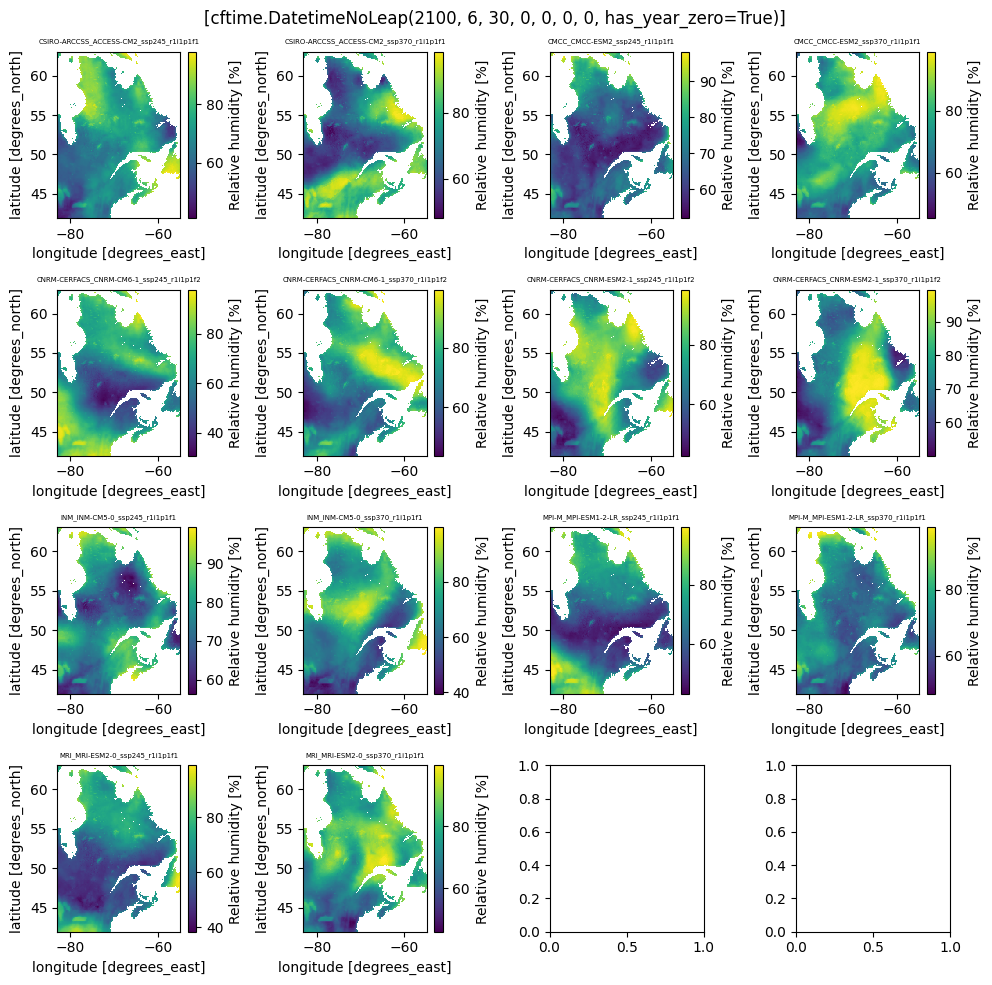

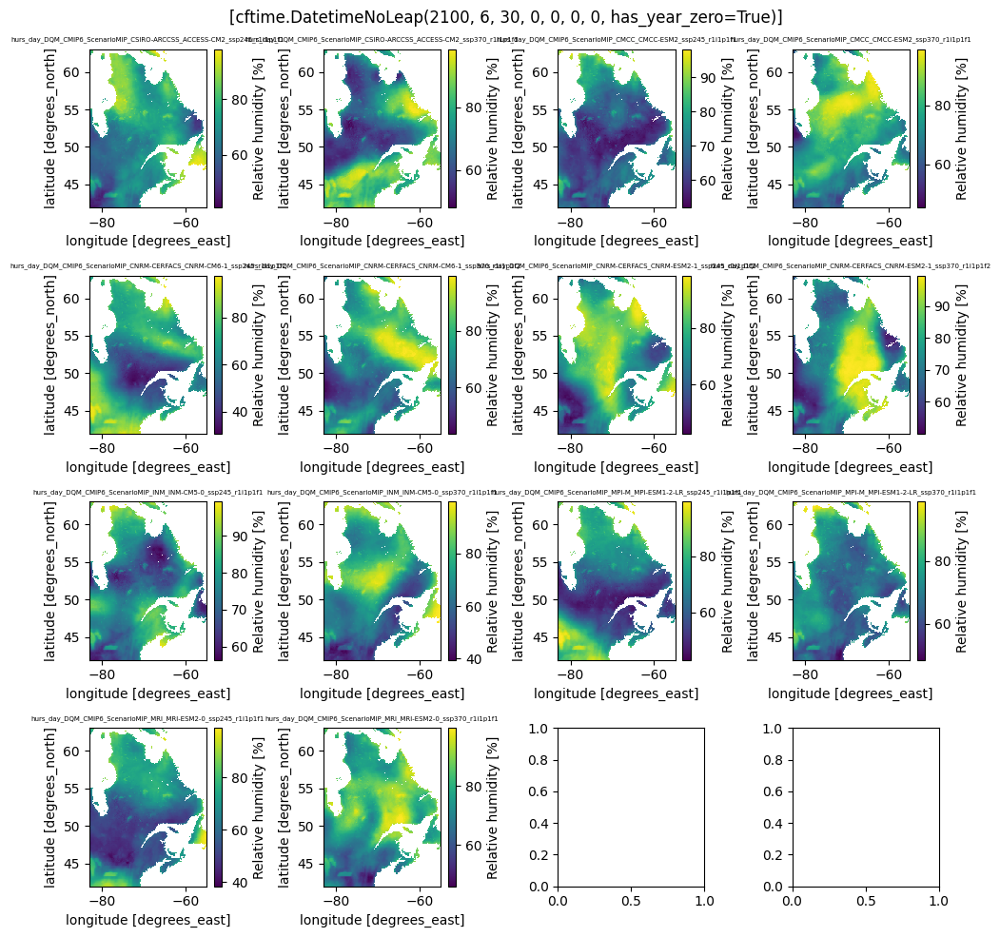

In [10]:
# summer
time='2100-06-30'
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        f=glob.glob(f'{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO-G6-E5L_v11/CMIP6/ScenarioMIP/QC-E5L/*/*/*/*/day/hurs/*{s}*{e}*')[0]
        ds= xr.open_zarr(f)
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=f.split("/")[-1]
            t=t.replace('hurs_day_DQM_CMIP6_ScenarioMIP_','')
            t=t.replace('_global_QC-E5L_1951-2100.zarr.zip','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        f=glob.glob(f'{CONFIG['paths']['final']}/staging/simulation/biasadjusted/ESPO-G6-E5L_v11/CMIP6/ScenarioMIP/QC-E5L/*/*/*/*/day/hurs/*{s}*{e}*')[0]
        ds= xr.open_zarr(f)
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=f.split("/")[-1]
            t=t.replace('hursTasmax_day_DQM_CMIP6_ScenarioMIP_','')
            t=t.replace('_global_QC-E5L_1951-2100.zarr.zip','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()

# raw

CSIRO-ARCCSS_ACCESS-CM2_ssp245_r1i1p1f1
global year
196.67969
global summer
196.67969
qc year
146.17969
qc summer
104.35156
CSIRO-ARCCSS_ACCESS-CM2_ssp370_r1i1p1f1
global year
196.67969
global summer
196.67969
qc year
150.53906
qc summer
104.578125
CMCC_CMCC-ESM2_ssp245_r1i1p1f1
global year
12662.673
global summer
12662.673
qc year
161.85887
qc summer
107.941284
CMCC_CMCC-ESM2_ssp370_r1i1p1f1
global year
13138.595
global summer
13138.595
qc year
164.15831
qc summer
109.152626
CNRM-CERFACS_CNRM-CM6-1_ssp245_r1i1p1f2
global year
100.0
global summer
100.0
qc year
100.0
qc summer
100.0
CNRM-CERFACS_CNRM-CM6-1_ssp370_r1i1p1f2
global year
100.0
global summer
100.0
qc year
100.0
qc summer
100.0
CNRM-CERFACS_CNRM-ESM2-1_ssp245_r1i1p1f2
global year
100.0
global summer
100.0
qc year
100.0
qc summer
100.0
CNRM-CERFACS_CNRM-ESM2-1_ssp370_r1i1p1f2
global year
100.0
global summer
100.0
qc year
100.0
qc summer
100.0
INM_INM-CM5-0_ssp245_r1i1p1f1
global year
196.8014
global summer
173.79291
qc year
10

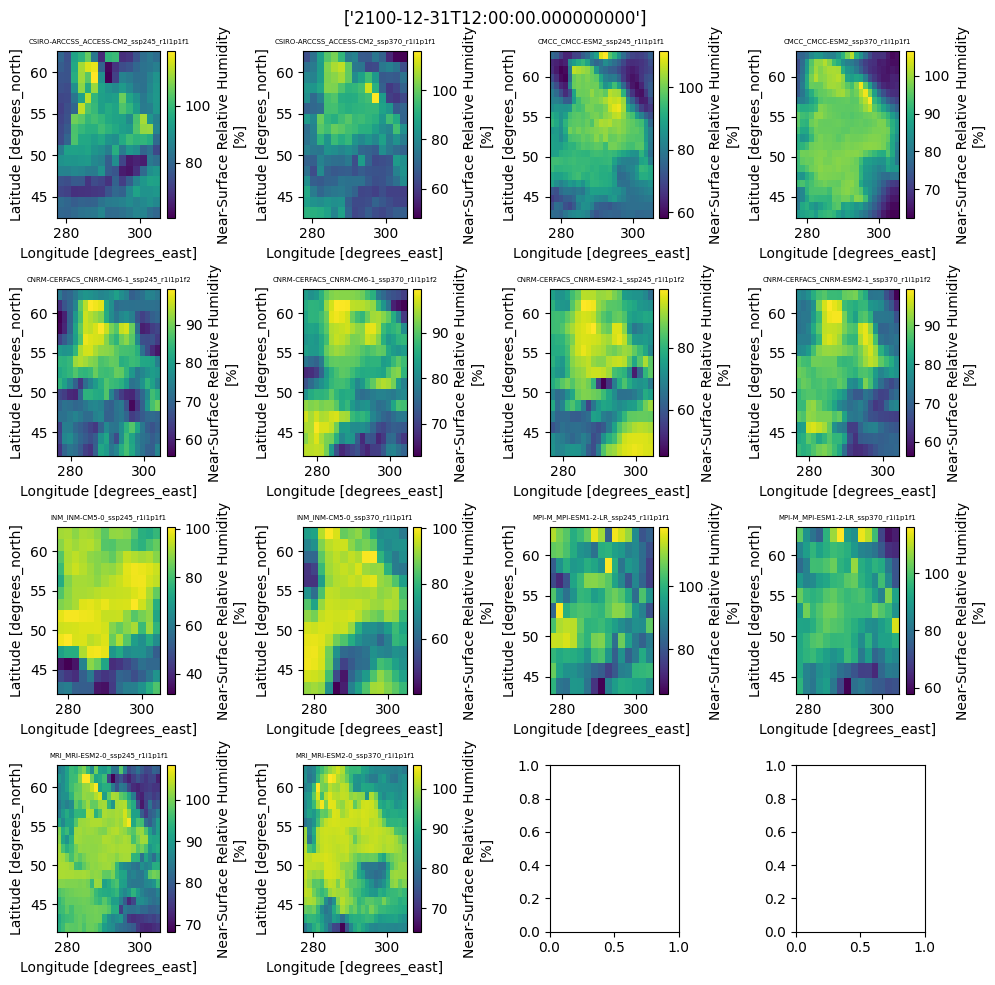

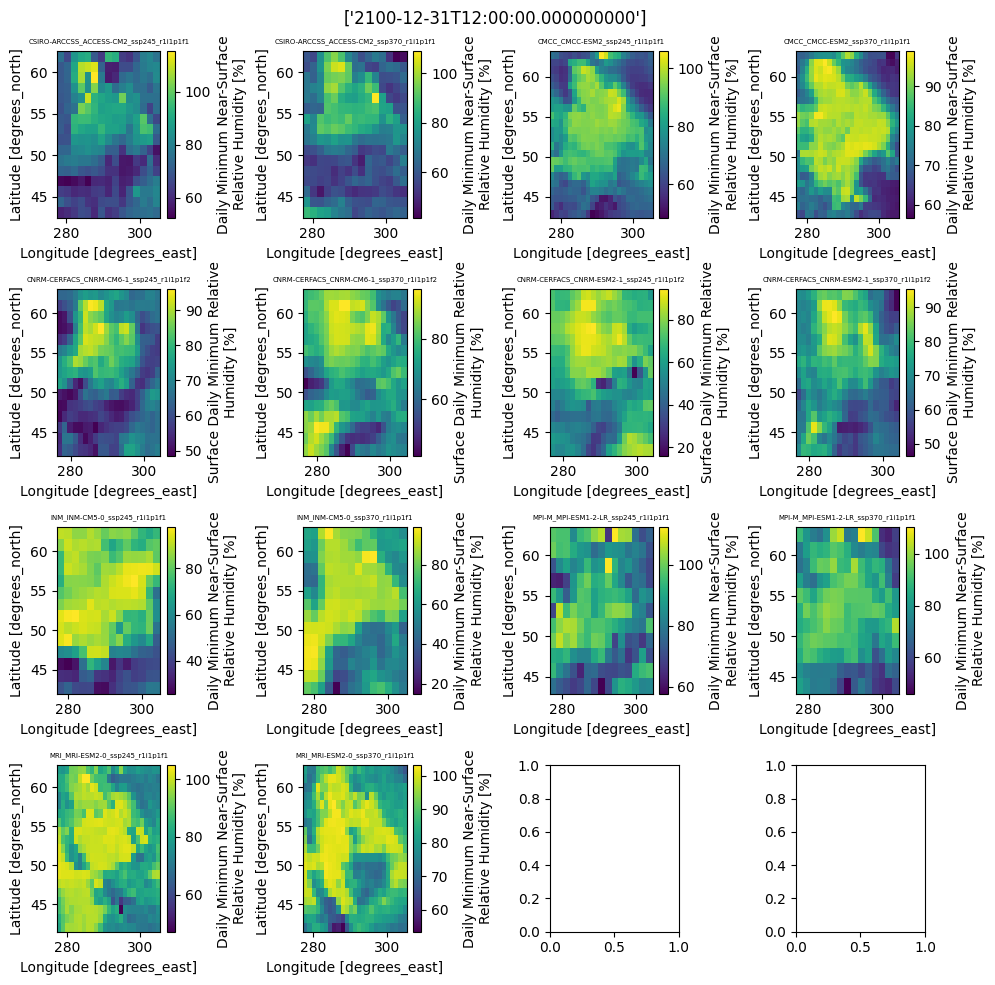

In [7]:
cat=xs.DataCatalog(CONFIG['extraction']['simulation']['search_data_catalogs']['data_catalogs'][0])

# weird spots in the winter
time='2100-12-31'
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        ds=cat.search(variable='hurs', xrfreq='D', processing_level='raw', source=s, experiment=e).to_dataset(
            xarray_open_kwargs={'engine':'h5netcdf'})
        t=ds.attrs['cat:id']
        t=t.replace('CMIP6_ScenarioMIP_','')
        t=t.replace('_global','')
        print(t)
        print('global year')
        print(ds.hurs.max().values)
        print('global summer')
        print(ds.sel(time=ds.time.dt.month.isin([6,7,8])).hurs.max().values)
        ds= xs.spatial.subset(ds, method='bbox',lon_bnds= [ -83, -55 ],lat_bnds= [ 42, 63 ])
        print('qc year')
        print(ds.hurs.max().values)
        print('qc summer')
        print(ds.sel(time=ds.time.dt.month.isin([6,7,8])).hurs.max().values)
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])

            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        ds=cat.search(variable='hursmin', xrfreq='D', processing_level='raw', source=s, experiment=e).to_dataset(
            xarray_open_kwargs={'engine':'h5netcdf'})
        t=ds.attrs['cat:id']
        t=t.replace('CMIP6_ScenarioMIP_','')
        t=t.replace('_global','')
        print(t)
        print('global year')
        print(ds.hursmin.max().values)
        print('global summer')
        print(ds.sel(time=ds.time.dt.month.isin([6,7,8])).hursmin.max().values)
        ds= xs.spatial.subset(ds, method='bbox',lon_bnds= [ -83, -55 ],lat_bnds= [ 42, 63 ])
        print('qc year')
        print(ds.hursmin.max().values)
        print('qc summer')
        print(ds.sel(time=ds.time.dt.month.isin([6,7,8])).hursmin.max().values)
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=ds.attrs['cat:id']
            t=t.replace('CMIP6_ScenarioMIP_','')
            t=t.replace('_global','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()

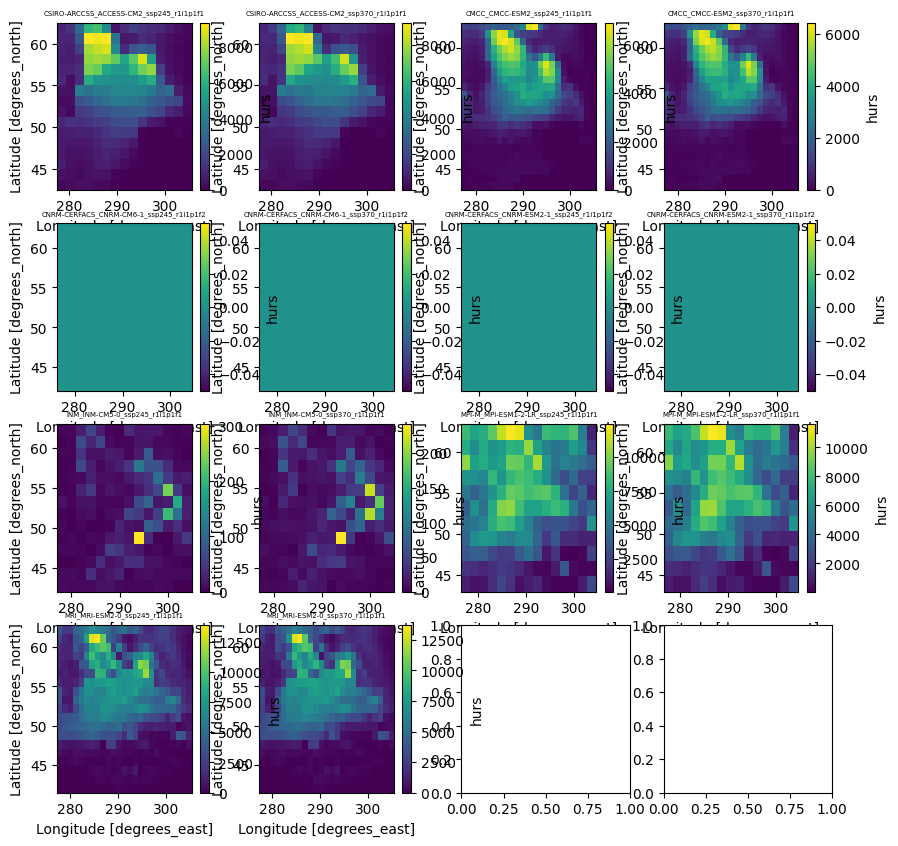

In [3]:
cat=xs.DataCatalog(CONFIG['extraction']['simulation']['search_data_catalogs']['data_catalogs'][0])

# weird spots in the winter
time='2100-12-31'
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        ds=cat.search(variable='hurs', xrfreq='D', processing_level='raw', source=s, experiment=e).to_dataset(
            xarray_open_kwargs={'engine':'h5netcdf'})
        t=ds.attrs['cat:id']
        t=t.replace('CMIP6_ScenarioMIP_','')
        t=t.replace('_global','')
        ds= xs.spatial.subset(ds, method='bbox',lon_bnds= [ -83, -55 ],lat_bnds= [ 42, 63 ])
        count_above_100 = (ds['hurs'] > 100).sum(dim="time")
        for var in ds.data_vars:
            count_above_100 .plot(ax=axs[i])
            axs[i].set_title(t, fontsize=5)
            i+=1


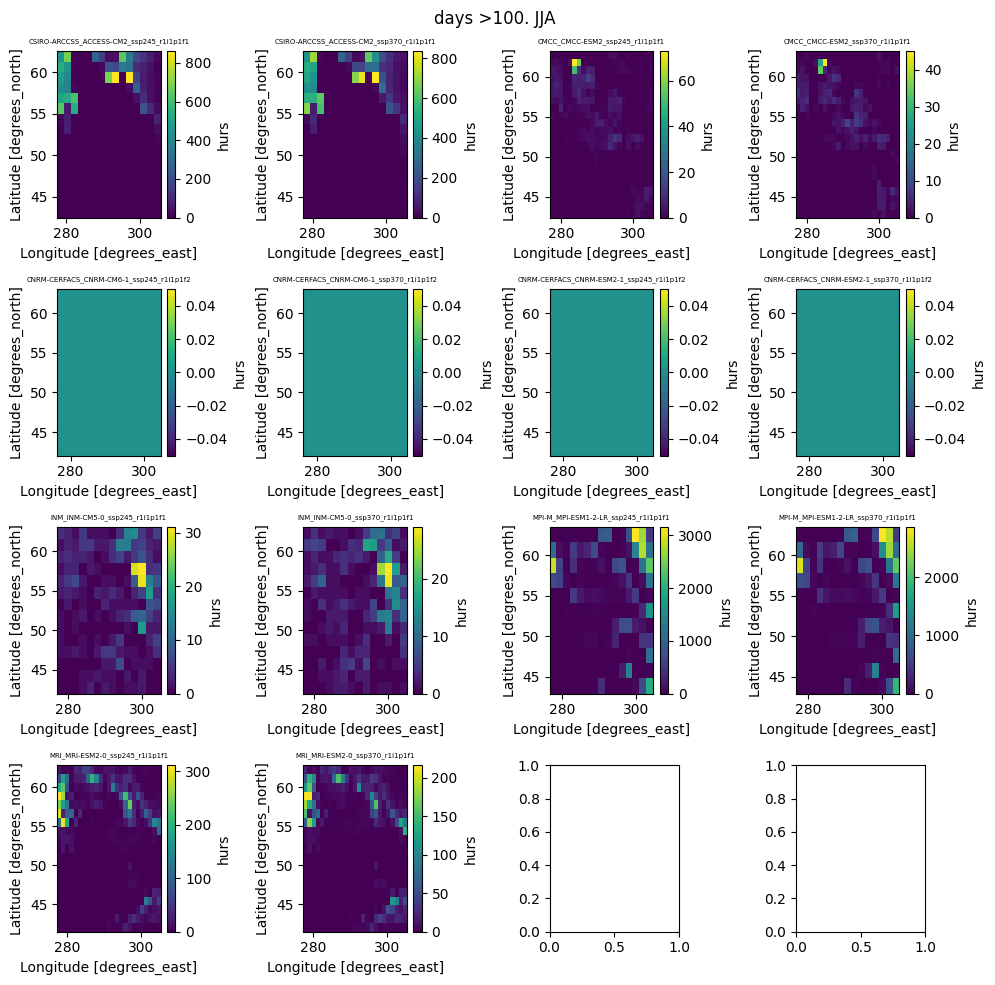

In [8]:
cat=xs.DataCatalog(CONFIG['extraction']['simulation']['search_data_catalogs']['data_catalogs'][0])

# weird spots in the winter
time='2100-12-31'
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        ds=cat.search(variable='hurs', xrfreq='D', processing_level='raw', source=s, experiment=e).to_dataset(
            xarray_open_kwargs={'engine':'h5netcdf'})
        ds=ds.sel(time=ds.time.dt.month.isin([6,7,8]))
        t=ds.attrs['cat:id']
        t=t.replace('CMIP6_ScenarioMIP_','')
        t=t.replace('_global','')
        ds= xs.spatial.subset(ds, method='bbox',lon_bnds= [ -83, -55 ],lat_bnds= [ 42, 63 ])
        count_above_100 = (ds['hurs'] > 100).sum(dim="time")
        for var in ds.data_vars:
            count_above_100 .plot(ax=axs[i])
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle("days >100. JJA")
fig.tight_layout()

In [ ]:
# weird spots in the winter
time='2100-07-31'
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        ds=cat.search(variable='hurs', xrfreq='D', processing_level='raw', source=s, experiment=e).to_dataset()
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=ds.attrs['cat:id']
            t=t.replace('CMIP6_ScenarioMIP_','')
            t=t.replace('_global','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()
fig, axs =plt.subplots(4,4, figsize=(10,10))
axs=axs.ravel()
i=0
for s in source:
    for e in exp:
        ds=cat.search(variable='hursmin', xrfreq='D', processing_level='raw', source=s, experiment=e).to_dataset()
        for var in ds.data_vars:
            ds[var].sel(time=time).plot(ax=axs[i])
            t=ds.attrs['cat:id']
            t=t.replace('CMIP6_ScenarioMIP_','')
            t=t.replace('_global','')
            axs[i].set_title(t, fontsize=5)
            i+=1
fig.suptitle(ds[var].sel(time=time).time.values)
fig.tight_layout()

In [23]:
cat=xs.DataCatalog(CONFIG['extraction']['simulation']['search_data_catalogs']['data_catalogs'][0])
subcat=cat.search(variable='hurs', xrfreq='D', processing_level='raw', activity='ScenarioMIP').to_dataset_dict()
for i, ds in subcat.items():
    

In [ ]:
c=xs.search_data_catalogs(**CONFIG['extraction']['simulation']['search_data_catalogs']['data_catalogs'])
c

In [35]:
CONFIG['extraction']['simulation']['search_data_catalogs']

{'variables_and_freqs': {'tasmax': 'D',
  'tasmin': 'D',
  'pr': 'D',
  'dtr': 'D',
  'hurs': 'D',
  'hursmin': 'D'},
 'match_hist_and_fut': True,
 'allow_conversion': True,
 'allow_resampling': False,
 'periods': ['1951', '2100'],
 'restrict_members': {'ordered': 1},
 'other_search_criteria': {'processing_level': 'raw',
  'experiment': ['ssp245', 'ssp370'],
  'source': ['ACCESS-CM2',
   'ACCESS-ESM1-5',
   'BCC-CSM2-MR',
   'CMCC-ESM2',
   'CNRM-ESM2-1',
   'CNRM-CM6-1',
   'FGOALS-g3',
   'GFDL-ESM4',
   'INM-CM5-0',
   'MIROC6',
   'MIROC-ES2L',
   'MPI-ESM1-2-HR',
   'MPI-ESM1-2-LR',
   'MRI-ESM2-0',
   'NorESM2-LM']},
 'data_catalogs': ['/project/ctb-frigon/scenario/catalogues/simulation.json']}

In [31]:
import numpy as np

np.sort(list(cat.search(variable='hursmin', xrfreq='D', processing_level='raw', activity='CMIP').df.source.unique()))

array(['ACCESS-CM2', 'CMCC-ESM2', 'CNRM-CM6-1', 'CNRM-CM6-1-HR',
       'CNRM-ESM2-1', 'CanESM5', 'CanESM5-1', 'EC-Earth3',
       'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'INM-CM4-8', 'INM-CM5-0',
       'IPSL-CM6A-LR', 'KACE-1-0-G', 'MIROC-ES2L', 'MIROC6',
       'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0'], dtype='<U16')

In [57]:
c=xs.search_data_catalogs(**{'variables_and_freqs': {'tasmax': 'D',
  'tasmin': 'D',
  'pr': 'D',
  'dtr': 'D',
  'hurs': 'D',
  'hursmin': 'D'},
 'match_hist_and_fut': True,
 'allow_conversion': True,
 'allow_resampling': False,
 'periods': [['1951', '2100']],
 'restrict_members': {'ordered': 1},
 'other_search_criteria': {'processing_level': 'raw',
  'experiment': ['ssp245', ],
  'source': [
   'MPI-ESM1-2-HR',
]},
 'data_catalogs': ['/project/ctb-frigon/scenario/catalogues/simulation.json']})
c

2025-08-11 11:11:07 INFO     xscen.extract   Catalog opened: < catalog with 702 dataset(s) from 49347 asset(s)> from 1 files.


INFO:xscen.extract:Catalog opened: < catalog with 702 dataset(s) from 49347 asset(s)> from 1 files.


2025-08-11 11:11:07 INFO     xscen.extract   Dispatching historical dataset to future experiments.


INFO:xscen.extract:Dispatching historical dataset to future experiments.


2025-08-11 11:11:09 INFO     xscen.extract   498 assets matched the criteria : {'processing_level': 'raw', 'experiment': ['ssp245'], 'source': ['MPI-ESM1-2-HR']}.


/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/xclim/core/indicator.py:296: UserWarning: Class conversions.WIND_SPEED_FROM_VECTOR already exists and will be overwritten.
/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/xclim/core/indicator.py:296: UserWarning: Class conversions.WIND_VECTOR_FROM_SPEED already exists and will be overwritten.
/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/xclim/core/indicator.py:296: UserWarning: Class conversions.TAS_MIDPOINT already exists and will be overwritten.
/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/xclim/core/indicator.py:296: UserWarning: Class conversions.RELATIVE_HUMIDITY_FROM_DEWPOINT already exists and will be overwritten.
/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/xclim/core/indicator.py:296: UserWarning: Class conversions.SPECIFIC_HUMIDITY already exists and will be overwritten.
/lustr

2025-08-11 11:11:09 INFO     xscen.extract   Iterating over 1 potential datasets.


INFO:xscen.extract:Iterating over 1 potential datasets.


2025-08-11 11:11:09 DEBUG    xscen.extract   At var tasmax, after search cat has []


DEBUG:xscen.extract:At var tasmax, after search cat has []


2025-08-11 11:11:09 DEBUG    xscen.extract   Dataset CMIP6_ScenarioMIP_DKRZ_MPI-ESM1-2-HR_ssp245_r1i1p1f1_global doesn't have all needed variables (missing at least tasmax).


DEBUG:xscen.extract:Dataset CMIP6_ScenarioMIP_DKRZ_MPI-ESM1-2-HR_ssp245_r1i1p1f1_global doesn't have all needed variables (missing at least tasmax).


2025-08-11 11:11:09 WARNING  xscen.extract   Found no match corresponding to the search criteria.


{}

In [52]:
ds=c['CMIP6_ScenarioMIP_DKRZ_MPI-ESM1-2-HR_ssp245_r1i1p1f1_global'].to_dataset()
ds

/lustre06/project/6046550/julavoie/envs/dqm-np2/lib/python3.12/site-packages/xclim/core/indicator.py:296: UserWarning: Class conversions.DTR already exists and will be overwritten.
HDF5-DIAG: Error detected in HDF5 (1.14.2) MPI-process 0:
  #000: H5A.c line 679 in H5Aopen_by_name(): unable to synchronously open attribute
    major: Attribute
    minor: Can't open object
  #001: H5A.c line 641 in H5A__open_by_name_api_common(): unable to open attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Can't open object
  #002: H5A.c line 464 in H5A__open_common(): unable to open attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Can't open object
  #003: H5VLcallback.c line 1138 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #004: H5VLcallback.c line 1105 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #005

In [56]:
ds

<xarray.Dataset> Size: 162GB
Dimensions:  (time: 91676, lat: 192, lon: 384)
Coordinates:
    height   float64 8B 2.0
  * lat      (lat) float64 2kB -89.28 -88.36 -87.42 -86.49 ... 87.42 88.36 89.28
  * lon      (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * time     (time) datetime64[ns] 733kB 1850-01-01T12:00:00 ... 2100-12-31T1...
Data variables:
    tasmax   (time, lat, lon) float32 27GB dask.array<chunksize=(1461, 50, 50), meta=np.ndarray>
    tasmin   (time, lat, lon) float32 27GB dask.array<chunksize=(1461, 50, 50), meta=np.ndarray>
    pr       (time, lat, lon) float32 27GB dask.array<chunksize=(1461, 50, 50), meta=np.ndarray>
    hurs     (time, lat, lon) float32 27GB dask.array<chunksize=(1461, 50, 50), meta=np.ndarray>
    hursmin  (time, lat, lon) float32 27GB dask.array<chunksize=(1461, 50, 50), meta=np.ndarray>
    dtr      (time, lat, lon) float32 27GB dask.array<chunksize=(1461, 50, 50), meta=np.ndarray>
Attributes: (12/47)
    Conventions:             CF-1.7 CMIP-6.2
    branch_method:           standard
    cat:_data_format_:       nc
    cat:activity:            ScenarioMIP
    cat:domain:              global
    cat:experiment:          ssp245
    ...                      ...
    table_info:              Creation Date:(09 May 2019) MD5:e6ef8ececc8f3386...
    title:                   MPI-ESM1-2-HR output prepared for CMIP6
    variant_label:           r1i1p1f1
    references:              MPI-ESM: Mauritsen, T. et al. (2019), Developmen...
    version_id:              v20190710
    intake_esm_dataset_key:  CMIP6_ScenarioMIP_DKRZ_MPI-ESM1-2-HR_ssp245_r1i1...

In [ ]:
 - ACCESS-CM2 
- CMCC-ESM2 
- CNRM-ESM2-1 
- CNRM-CM6-1
- INM-CM5-0
- MPI-ESM1-2-HR
- MPI-ESM1-2-LR 
- MRI-ESM2-0 


In [ ]:
subcat=cat.search(variable='hurs', xrfreq='D', processing_level='raw', activity='ScenarioMIP').to_dataset_dict()
for i, ds in subcat.items():
    

In [2]:
ds=xr.open_zarr('/scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp245_r1i1p1f1_global+QC-E5L+QC-E5L+hursTasmax+training.zarr')
ds

<xarray.Dataset> Size: 5GB
Dimensions:    (loc: 35443, dayofyear: 365, quantiles: 50)
Coordinates:
  * dayofyear  (dayofyear) int64 3kB 1 2 3 4 5 6 7 ... 360 361 362 363 364 365
    lat        (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
    lon        (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
  * quantiles  (quantiles) float32 200B 0.01 0.03 0.05 0.07 ... 0.95 0.97 0.99
Dimensions without coordinates: loc
Data variables:
    af         (loc, dayofyear, quantiles) float32 3GB dask.array<chunksize=(600, 365, 50), meta=np.ndarray>
    hist_q     (loc, dayofyear, quantiles) float32 3GB dask.array<chunksize=(600, 365, 50), meta=np.ndarray>
    scaling    (loc, dayofyear) float32 52MB dask.array<chunksize=(600, 365), meta=np.ndarray>
Attributes:
    _xsdba_adjustment:     {"py/object": "xsdba.adjustment.DetrendedQuantileM...
    adj_params:            DetrendedQuantileMapping(group=Grouper(name='time....
    cat:domain:            QC-E5L
    cat:id:                CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp245_r1i1p1f1_gl...
    cat:processing_level:  training_hursTasmax
    cat:xrfreq:            D
    train_params:          {'var': ['hursTasmax'], 'maximal_calendar': 'nolea...

In [3]:
ds.isel(quantiles=-1, dayofyear=0).af.values

array([2.155204 , 1.514926 , 4.4074106, ...,      -inf,      -inf,
            -inf], dtype=float32)

/lustre06/project/6046550/julavoie/envs/dqm/lib/python3.12/site-packages/dask/_task_spec.py:741: RuntimeWarning: divide by zero encountered in log
/lustre06/project/6046550/julavoie/envs/dqm/lib/python3.12/site-packages/dask/_task_spec.py:741: RuntimeWarning: divide by zero encountered in log
/lustre06/project/6046550/julavoie/envs/dqm/lib/python3.12/site-packages/dask/_task_spec.py:741: RuntimeWarning: divide by zero encountered in log
/lustre06/project/6046550/julavoie/envs/dqm/lib/python3.12/site-packages/dask/_task_spec.py:741: RuntimeWarning: divide by zero encountered in log
/lustre06/project/6046550/julavoie/envs/dqm/lib/python3.12/site-packages/dask/_task_spec.py:741: RuntimeWarning: divide by zero encountered in log
/lustre06/project/6046550/julavoie/envs/dqm/lib/python3.12/site-packages/dask/_task_spec.py:741: RuntimeWarning: divide by zero encountered in log


In [ ]:
dref=xr.open_zarr('/project/ctb-frigon/julavoie/DQM-lait/reference/split_regions/QC-E5L_QC-E5L_noleap.zarr.zip')
, /project/ctb-frigon/julavoie/DQM-lait/reference/split_regions/QC-E5L_QC-E5L_360_day.zarr.zip, /scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp370_r1i1p1f1_global+QC-E5L+QC-E5L+regchunked.zarr


In [10]:
ds_hist

<xarray.Dataset> Size: 47GB
Dimensions:  (time: 54750, loc: 35443)
Coordinates:
    lat      (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
    lon      (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
  * time     (time) object 438kB 1951-01-01 00:00:00 ... 2100-12-31 00:00:00
Dimensions without coordinates: loc
Data variables:
    dtr      (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    hurs     (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    hursmin  (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    pr       (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    tasmax   (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    tasmin   (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
Attributes: (12/65)
    Conventions:             CF-1.7 CMIP-6.2
    activity_id:             CMIP
    branch_method:           standard
    branch_time_in_child:    0.0
    branch_time_in_parent:   90885.0
    cat:_data_format_:       nc
    ...                      ...
    sub_experiment_id:       none
    table_id:                day
    table_info:              Creation Date:(20 February 2019) MD5:951084b632b...
    title:                   INM-CM5-0 output prepared for CMIP6
    variable_id:             tasmax
    variant_label:           r1i1p1f1

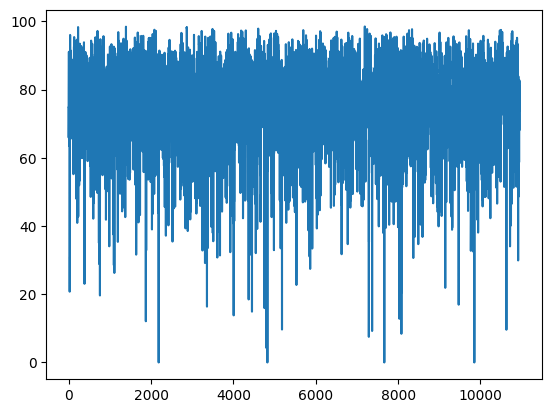

In [65]:
from matplotlib import pyplot as plt
ds_hist = xr.open_zarr('/scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp370_r1i1p1f1_global+QC-E5L+QC-E5L+regchunked.zarr', decode_timedelta=False)
plt.plot(ds_hist.sel(time=slice('1991','2020')).isel(loc=-1).hursmin.values)

In [66]:
ds_hist.hursmin.dtype

dtype('float32')

In [59]:
from typing import cast
lower_bound_array = np.array(0).astype(float)
upper_bound_array = np.array(100).astype(float)
data_prime = ([0] - lower_bound_array) / (
                upper_bound_array - lower_bound_array  # pylint: disable=E0606
            )
data_prime
out = cast(xr.DataArray, np.log(data_prime / (1 - data_prime)))
out

/tmp/ipykernel_3662150/320442533.py:8: RuntimeWarning: divide by zero encountered in log


array([-inf])

In [62]:
from xsdba.testing import (
    test_cannon_2015_dist,
    test_cannon_2015_rvs,
    test_timelonlatseries,
    test_timeseries,
)
import xsdba as xa
import numpy as np
hurs = test_timeseries(np.array([0,100]), units="%").astype(np.float32)
hurslogit = xa.processing.to_additive_space(
    hurs,
    lower_bound="0 %",
    trans="logit",
    upper_bound="100 %",
    clip_next_to_bounds=True,
)
print(hurslogit)

<xarray.DataArray (time: 2)> Size: 8B
array([     -inf, 16.635532], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 16B 2000-07-01 2000-07-02
Attributes:
    xsdba_transform:        logit
    xsdba_transform_lower:  0.0
    xsdba_transform_upper:  100.0
    xsdba_transform_units:  %
    units:                  
    history:                [2025-08-05 10:39:20] : to_additive_space(data=<a...


0.0
1e-45


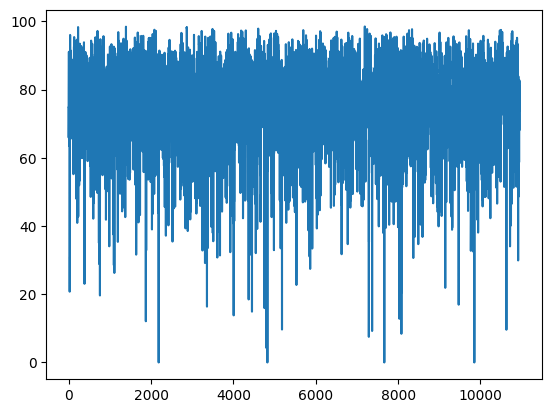

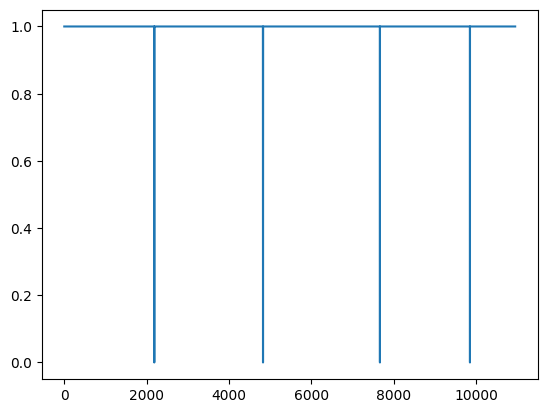

In [42]:
import xsdba as xa
ds_hist = xr.open_zarr('/scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp370_r1i1p1f1_global+QC-E5L+QC-E5L+regchunked.zarr', decode_timedelta=False)
print(ds_hist.hursmin.min().values)
low = np.nextafter(0, np.inf, dtype=np.float32)
high = np.nextafter(100, -np.inf, dtype=np.float32)

data = ds_hist.hursmin.clip(low, high)
print(data.min().values)
plt.plot(data.sel(time=slice('1991','2020')).isel(loc=-1).values)
out=xa.processing.to_additive_space(data=data ,                   
                    lower_bound= "0 %",
                    upper_bound= "100 %",
                    trans= "logit",
                    clip_next_to_bounds= False
                                   )
plt.figure()
plt.plot(xr.ufuncs.isfinite(out.sel(time=slice('1991','2020')).isel(loc=-1)).values)

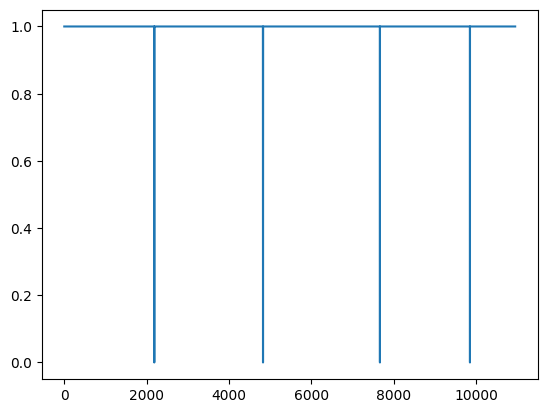

In [28]:
plt.plot(xr.ufuncs.isfinite(out.sel(time=slice('1991','2020')).isel(loc=-1)).values)

In [19]:
import numpy as np
np.nextafter(0, np.inf, dtype=np.float32)

1e-45

In [2]:
import xarray as xr
import xscen as xs
from xscen import CONFIG
import xclim as xc
import numpy as np
import xsdba as xa
from workflow.scripts.utils import dask_cluster


xs.load_config("config/config_general.yml", "config/config_region.yml", "config/paths.yml")

# load hist ds (simulation)
ds_hist = xr.open_zarr("/scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp245_r1i1p1f1_global+QC-E5L+QC-E5L+regchunked.zarr", decode_timedelta=False)

# trick for biasadjustement of hursmin (sim) on hursTasmax (ref)
ds_hist = ds_hist.rename({'hursmin': 'hursTasmax'})

ds_hist=ds_hist.isel(loc=-1)

# load ref ds
# choose right calendar
simcal = xc.core.calendar.get_calendar(ds_hist)
refcal = xs.utils.minimum_calendar(simcal, 'noleap')

# snakemake can't have 360_day as a keyword..
input_cal = 'noleap' if refcal == 'noleap' else  'day360' if refcal == '360_day' else 'unknown'
ds_ref = xr.open_zarr('/project/ctb-frigon/julavoie/DQM-lait/reference/split_regions/QC-E5L_QC-E5L_noleap.zarr.zip', decode_timedelta=False)
ds_ref=ds_ref.isel(loc=-1)



ds_hist['hursTasmax']=xa.processing.to_additive_space(
    ds_hist['hursTasmax'],
    lower_bound= "0 %",
    upper_bound= "100 %",
    trans= "logit",
    clip_next_to_bounds= "permissive",)

print(ds_hist['hursTasmax'].min().values)
# training
ds_tr = xs.train(
    dref=ds_ref,
    dhist=ds_hist,
    var=['hursTasmax'],
    **CONFIG['biasadjust']['variables']['hursTasmax']['training_args']
    )

ds_tr = ds_tr.chunk({d: CONFIG['chunks']['working'][d] for d in ds_tr.dims
                        if d in CONFIG['chunks']['working'].keys()})

for v in ['lat','lon']:
    del ds_tr[v].encoding['chunks']

ds_tr.af.values

AttributeError: module 'mpi4py.MPI' has no attribute 'Session'

In [17]:
xa.processing.to_additive_space?

Signature:
xa.processing.to_additive_space(
    data: 'xr.DataArray',
    lower_bound: 'str',
    upper_bound: 'str | None' = None,
    trans: 'str' = 'log',
    clip_next_to_bounds: 'str' = False,
)
Docstring:
Transform a non-additive variable into an additive space by the means of a log or logit transformation.

Based on :cite:t:`alavoine_distinct_2022`.

Parameters
----------
data : xr.DataArray
    A variable that can't usually be bias-adjusted by additive methods.
lower_bound : str
    The smallest physical value of the variable, excluded, as a Quantity string.
    The data should only have values strictly larger than this bound.
upper_bound : str, optional
    The largest physical value of the variable, excluded, as a Quantity string.
    Only relevant for the logit transformation.
    The data should only have values strictly smaller than this bound.
trans : {'log', 'logit'}
    The transformation to use. See notes.
clip_next_to_bounds : {False, 'strict', 'permissive'}
    If no

In [15]:
ds_hist.hursTasmax.dtype

dtype('float32')

In [18]:
np.__version__

'1.26.4'

In [8]:
display(ds_hist)
display(ds_ref)

<xarray.Dataset> Size: 2MB
Dimensions:     (time: 54750)
Coordinates:
    lat         float32 4B dask.array<chunksize=(), meta=np.ndarray>
    lon         float32 4B dask.array<chunksize=(), meta=np.ndarray>
  * time        (time) object 438kB 1951-01-01 00:00:00 ... 2100-12-31 00:00:00
Data variables:
    dtr         (time) float32 219kB dask.array<chunksize=(54750,), meta=np.ndarray>
    hurs        (time) float32 219kB dask.array<chunksize=(54750,), meta=np.ndarray>
    hursTasmax  (time) float32 219kB dask.array<chunksize=(54750,), meta=np.ndarray>
    pr          (time) float32 219kB dask.array<chunksize=(54750,), meta=np.ndarray>
    tasmax      (time) float32 219kB dask.array<chunksize=(54750,), meta=np.ndarray>
    tasmin      (time) float32 219kB dask.array<chunksize=(54750,), meta=np.ndarray>
Attributes: (12/65)
    Conventions:             CF-1.7 CMIP-6.2
    activity_id:             CMIP
    branch_method:           standard
    branch_time_in_child:    0.0
    branch_time_in_parent:   90885.0
    cat:_data_format_:       nc
    ...                      ...
    sub_experiment_id:       none
    table_id:                day
    table_info:              Creation Date:(20 February 2019) MD5:951084b632b...
    title:                   INM-CM5-0 output prepared for CMIP6
    variable_id:             tasmax
    variant_label:           r1i1p1f1

<xarray.Dataset> Size: 9GB
Dimensions:     (time: 10950, loc: 35443)
Coordinates:
    lat         (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
    lon         (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
  * time        (time) object 88kB 1991-01-01 00:00:00 ... 2020-12-31 00:00:00
Dimensions without coordinates: loc
Data variables:
    dtr         (time, loc) float32 2GB dask.array<chunksize=(10950, 600), meta=np.ndarray>
    hurs        (time, loc) float32 2GB dask.array<chunksize=(10950, 600), meta=np.ndarray>
    hursTasmax  (time, loc) float32 2GB dask.array<chunksize=(10950, 600), meta=np.ndarray>
    pr          (time, loc) float32 2GB dask.array<chunksize=(10950, 600), meta=np.ndarray>
    tasmax      (time, loc) float32 2GB dask.array<chunksize=(10950, 600), meta=np.ndarray>
    tasmin      (time, loc) float32 2GB dask.array<chunksize=(10950, 600), meta=np.ndarray>
Attributes: (12/34)
    Conventions:             CF-1.9
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    cat:_data_format_:       zarr
    cat:calendar:            noleap
    ...                      ...
    project:                 era5-land
    realm:                   atmos
    source:                  ERA5-Land
    table_id:                ECMWF
    type:                    reconstruction
    version:                 v2022.12.23

noleap


<xarray.Dataset> Size: 47GB
Dimensions:     (time: 54750, loc: 35443)
Coordinates:
    lat         (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
    lon         (loc) float32 142kB dask.array<chunksize=(600,), meta=np.ndarray>
  * time        (time) object 438kB 1951-01-01 00:00:00 ... 2100-12-31 00:00:00
Dimensions without coordinates: loc
Data variables:
    dtr         (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    hurs        (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    hursTasmax  (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    pr          (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    tasmax      (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
    tasmin      (time, loc) float32 8GB dask.array<chunksize=(54750, 600), meta=np.ndarray>
Attributes: (12/65)
    Conventions:             CF-1.7 CMIP-6.2
    activity_id:             CMIP
    branch_method:           standard
    branch_time_in_child:    0.0
    branch_time_in_parent:   90885.0
    cat:_data_format_:       nc
    ...                      ...
    sub_experiment_id:       none
    table_id:                day
    table_info:              Creation Date:(20 February 2019) MD5:951084b632b...
    title:                   INM-CM5-0 output prepared for CMIP6
    variable_id:             tasmax
    variant_label:           r1i1p1f1

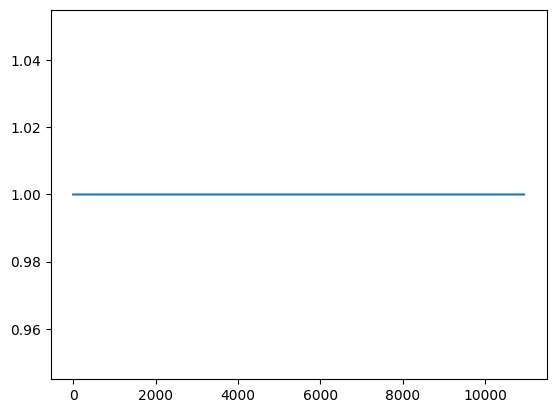

In [55]:
import xarray as xr
import xscen as xs
from xscen import CONFIG
import xclim as xc
import numpy as np
from workflow.scripts.utils import dask_cluster
if 1==0: #trick vscode
    import snakemake

xs.load_config("config/config_general.yml", "config/config_region.yml", "config/paths.yml")



# load hist ds (simulation)
ds_hist = xr.open_zarr('/scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp370_r1i1p1f1_global+QC-E5L+QC-E5L+regchunked.zarr', decode_timedelta=False)

# trick for biasadjustement of hursmin (sim) on hursTasmax (ref)
ds_hist = ds_hist.rename({'hursmin': 'hursTasmax'})

#TODO: maybe put in xsdba
lower_bound = 0
upper_bound = 100
mini=ds_hist['hursTasmax'].min().values
maxi=ds_hist['hursTasmax'].max().values
with open(f"{CONFIG['paths']['final']}/busted_bounds/hist_hursTasmax_{ds_hist.attrs['cat:id']}_{ds_hist.attrs['cat:domain']}.txt", "a") as f:
    f.write(f"{ds_hist.attrs['cat:id']}-{ds_hist.attrs['cat:domain']}\n hurs min: {mini}\n max: {maxi}\n")

low = np.nextafter(lower_bound, np.inf, dtype=np.float32).astype(float)
high = (
    None
    if upper_bound is None
    else np.nextafter(upper_bound, -np.inf, dtype=np.float32)
)
ds_hist['hursTasmax'] = ds_hist['hursTasmax'].clip(low, high)
plt.plot(xr.ufuncs.isfinite(ds_hist['hursTasmax'].sel(time=slice('1991','2020')).isel(loc=-1)).values)
# load ref ds
# choose right calendar
simcal = xc.core.calendar.get_calendar(ds_hist)
refcal = xs.utils.minimum_calendar(simcal, 'noleap')

# snakemake can't have 360_day as a keyword..
input_cal = 'noleap' if refcal == 'noleap' else  'day360' if refcal == '360_day' else 'unknown'
print(input_cal)
display(ds_hist)
#ds_ref = xr.open_zarr(getattr(snakemake.input, input_cal), decode_timedelta=False)

# # training
# ds_tr = xs.train(
#     dref=ds_ref,
#     dhist=ds_hist,
#     var=[snakemake.wildcards.var],
#     **CONFIG['biasadjust']['variables'][snakemake.wildcards.var]['training_args']
#     )

# ds_tr = ds_tr.chunk({d: CONFIG['chunks']['working'][d] for d in ds_tr.dims
#                         if d in CONFIG['chunks']['working'].keys()})

# for v in ['lat','lon']:
#     del ds_tr[v].encoding['chunks']



<xarray.DataArray 'hursTasmax' (time: 54750)> Size: 219kB
dask.array<truediv, shape=(54750,), dtype=float32, chunksize=(54750,), chunktype=numpy.ndarray>
Coordinates:
    lat      float32 4B dask.array<chunksize=(), meta=np.ndarray>
    lon      float32 4B dask.array<chunksize=(), meta=np.ndarray>
  * time     (time) object 438kB 1951-01-01 00:00:00 ... 2100-12-31 00:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean time: minimum (interval: 1 day)
    comment:        The relative humidity with respect to liquid water for T>...
    history:        2019-06-06T12:50:51Z altered by CMOR: Treated scalar dime...
    long_name:      Daily Minimum Near-Surface Relative Humidity
    original_name:  hursmin
    standard_name:  relative_humidity
    units:          %

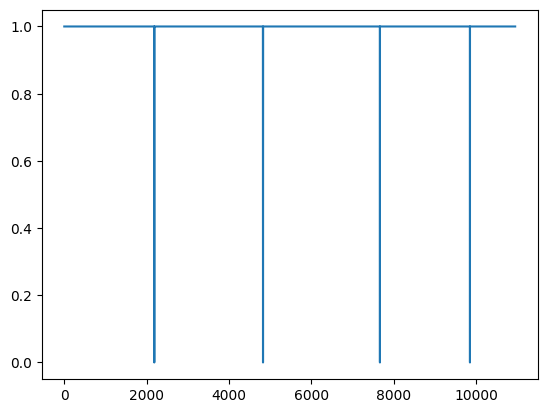

In [21]:
import xarray as xr
import xscen as xs
from xscen import CONFIG
import xclim as xc
import numpy as np
from workflow.scripts.utils import dask_cluster
from matplotlib import pyplot as plt

xs.load_config("config/config_general.yml", "config/config_region.yml", "config/paths.yml")


var='hursTasmax'
# load hist ds (simulation)
ds_hist = xr.open_zarr('/scratch/julavoie/espo-workdir/CMIP6_ScenarioMIP_INM_INM-CM5-0_ssp370_r1i1p1f1_global+QC-E5L+QC-E5L+regchunked.zarr', decode_timedelta=False)

# trick for biasadjustement of hursmin (sim) on hursTasmax (ref)
ds_hist = ds_hist.rename({'hursmin': 'hursTasmax'})


# load ref ds
# choose right calendar
simcal = xc.core.calendar.get_calendar(ds_hist)
refcal = xs.utils.minimum_calendar(simcal, 'noleap')

# snakemake can't have 360_day as a keyword..
input_cal = 'noleap' if refcal == 'noleap' else  'day360' if refcal == '360_day' else 'unknown'
ds_ref = xr.open_zarr('/project/ctb-frigon/julavoie/DQM-lait/reference/split_regions/QC-E5L_QC-E5L_noleap.zarr.zip', decode_timedelta=False)


ds_hist=ds_hist.isel(loc=-1)
ds_ref=ds_ref.isel(loc=-1)
from xsdba.units import harmonize_units
from typing import cast

@harmonize_units(["data", "lower_bound", "upper_bound"])
def to_additive_space(
    data: xr.DataArray,
    lower_bound: str,
    upper_bound: str | None = None,
    trans: str = "log",
    clip_next_to_bounds: str = False,
):


    lower_bound_array = np.array(lower_bound).astype(float)
    if upper_bound is not None:
        upper_bound_array = np.array(upper_bound).astype(float)

    # clip bounds
    if clip_next_to_bounds:
        if (
            (data < lower_bound).any() or (data > (upper_bound or np.nan)).any()
        ) and clip_next_to_bounds != "permissive":
            raise ValueError(
                "The input dataset contains values outside of the range [lower_bound, upper_bound] "
                "(with upper_bound given by infinity if it is not specified). Clipping the values to the range "
                "]lower_bound, upper_bound[ is not allowed in this case. Check if the bounds are taken appropriately or "
                "if your input dataset has unphysical values."
            )

        low = np.nextafter(lower_bound, np.inf, dtype=np.float32).astype(float)
        high = (
            None
            if upper_bound is None
            else np.nextafter(upper_bound, -np.inf, dtype=np.float32).astype(float)
        )
        data = data.clip(low, high)

    with xr.set_options(keep_attrs=True), np.errstate(divide="ignore"):
        if trans == "log":
            out = cast(xr.DataArray, np.log(data - lower_bound_array))
        elif trans == "logit" and upper_bound is not None:
            data_prime = (data - lower_bound_array) / (
                upper_bound_array - lower_bound_array  # pylint: disable=E0606
            )
            display(data_prime)
            out = cast(xr.DataArray, np.log(data_prime / (1 - data_prime)))
        else:
            raise NotImplementedError("`trans` must be one of 'log' or 'logit'.")

    # Attributes to remember all this.
    out = out.assign_attrs(xsdba_transform=trans)
    out = out.assign_attrs(xsdba_transform_lower=lower_bound_array)
    if upper_bound is not None:
        out = out.assign_attrs(xsdba_transform_upper=upper_bound_array)
    if "units" in out.attrs:
        out = out.assign_attrs(xsdba_transform_units=out.attrs.pop("units"))
        out = out.assign_attrs(units="")
    return out


out=to_additive_space(data=ds_hist[var] ,                   
                    lower_bound= "0 %",
                    upper_bound= "100 %",
                    trans= "logit",
                    clip_next_to_bounds= True
                                   )

plt.plot(xr.ufuncs.isfinite(out.sel(time=slice('1991','2020')).values))


# # training
# ds_tr = xs.train(
#     dref=ds_ref,
#     dhist=ds_hist,
#     var=[var],
#     **CONFIG['biasadjust']['variables'][var]['training_args']
#     )

# ds_tr = ds_tr.chunk({d: CONFIG['chunks']['working'][d] for d in ds_tr.dims
#                         if d in CONFIG['chunks']['working'].keys()})

# for v in ['lat','lon']:
#     del ds_tr[v].encoding['chunks']

# ds_tr

In [22]:
import numpy as np
np.__version__

'1.26.4'

In [8]:
import xsdba as xa
xa.__version__

'0.5.0'